In [1]:
import cv2

image = cv2.imread("res/lab1.jpg")
image.shape


(853, 1280, 3)

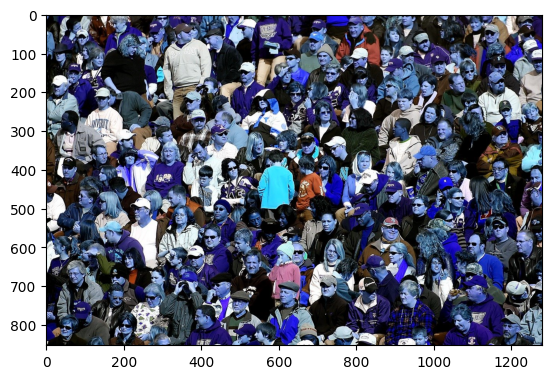

In [2]:
new_image = image.copy()
# cv2.imshow(new_image)
# cv2.waitKey(0)
from matplotlib import pyplot

pyplot.imshow(new_image)


In [3]:
pyplot.rcParams["figure.figsize"] = [20, 10]
(B, G, R) = image[70, 10]  # image to tablica kolorow
# domyslny format to BGR (nie RGB!)


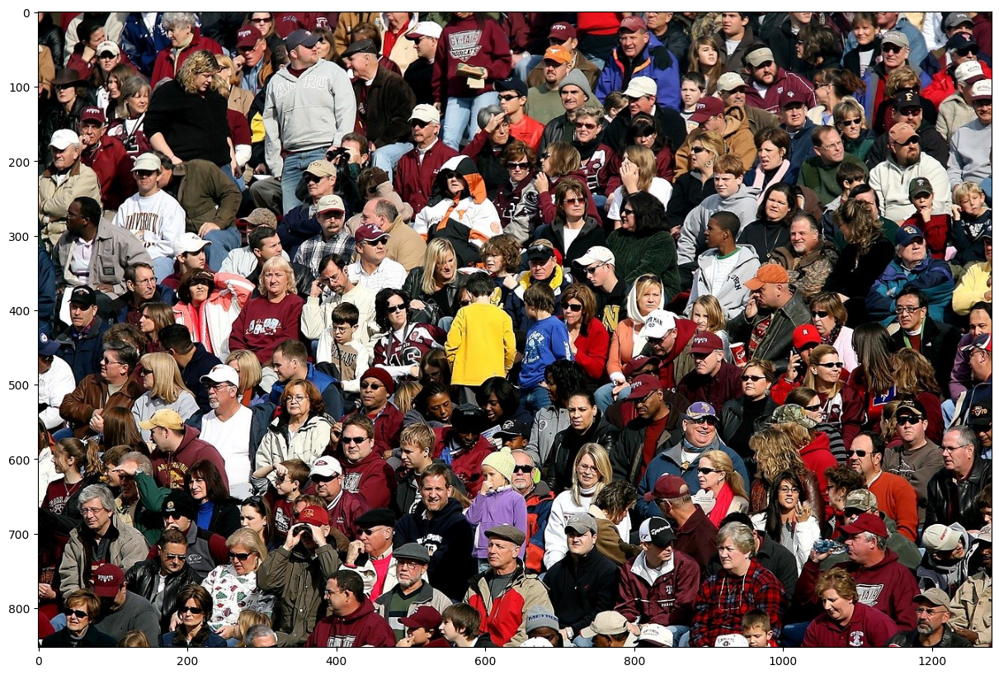

In [4]:
# konwersja barw
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pyplot.imshow(image_rgb)


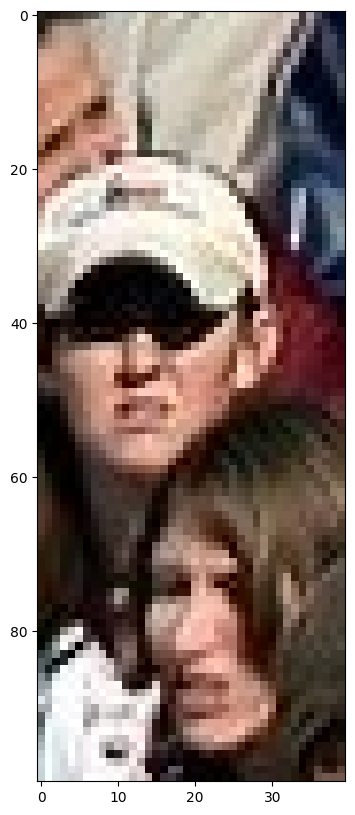

In [5]:
# wyciecie fragmentu obrazu
image_part = image_rgb[20:120, 80:120]
pyplot.imshow(image_part)

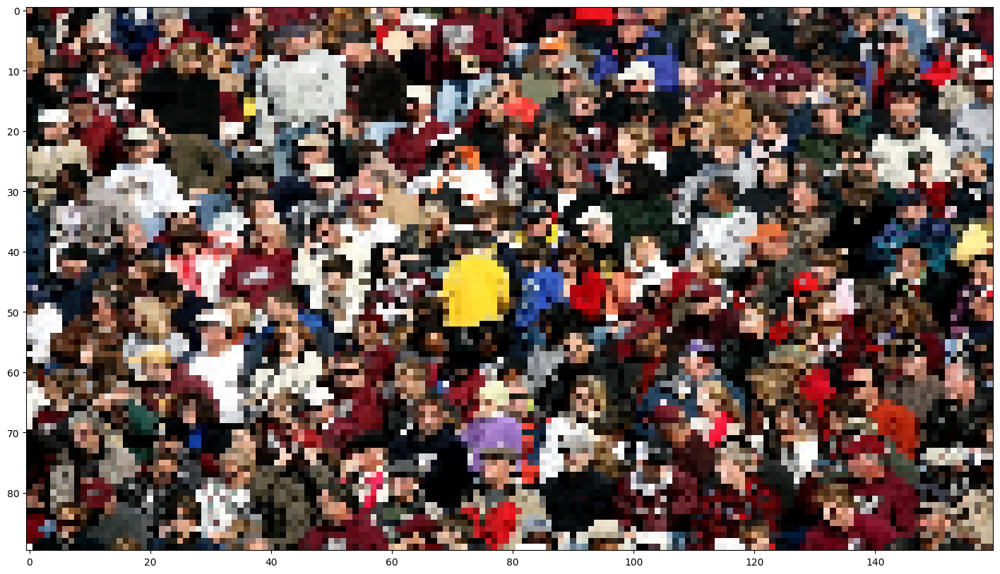

In [6]:
# zmiana rozmiaru
resized = cv2.resize(image_rgb, (160, 90))
pyplot.imshow(resized)

In [7]:
# wyznaczenie srodka obrazu
size: tuple[int, int] = image.shape[0:2]
center: tuple[int, int] = tuple(axis // 2 for axis in size)
print(f"{size=}, {center=}")


size=(853, 1280), center=(426, 640)


### REALIZACJA CWICZENIA

In [8]:
# a) done
# b) done
# c) done
# d) done
# e) Zmniejsz obraz o 50% - obliczając automatycznie new_x, new_y tak by
#    zachować proporcję wymiarów obrazu

half_size: tuple[int, int] = tuple[int, int](int(axis // 2) for axis in image.shape[0:2])
half_size = half_size[::-1]  # reversing to get [y, x] for resize
half_size


(640, 426)

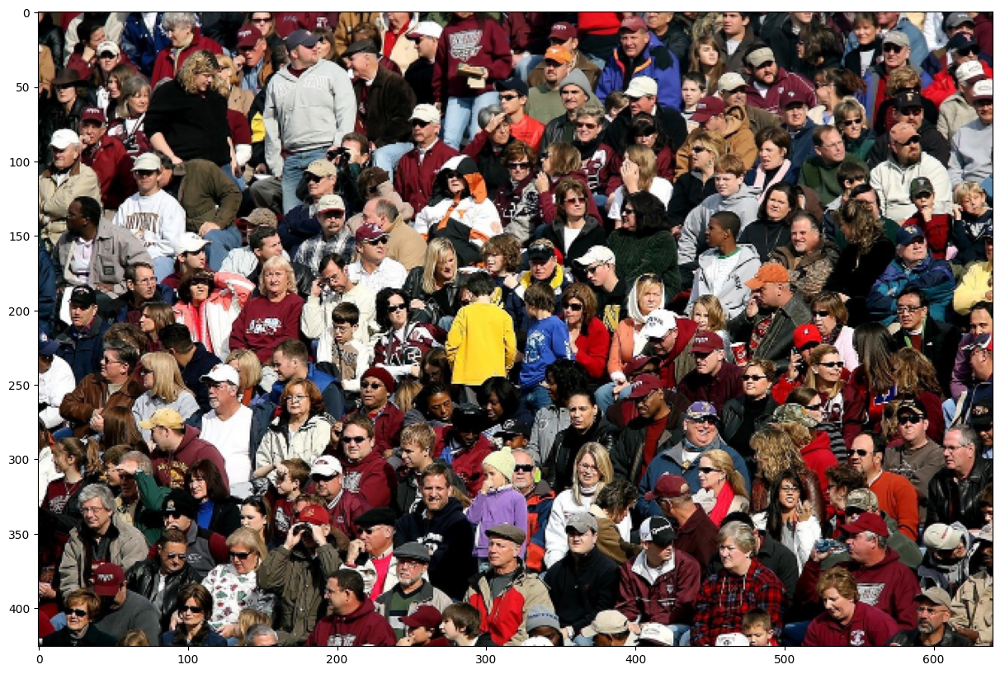

In [9]:
half_image = cv2.resize(image_rgb, half_size)
pyplot.imshow(half_image)

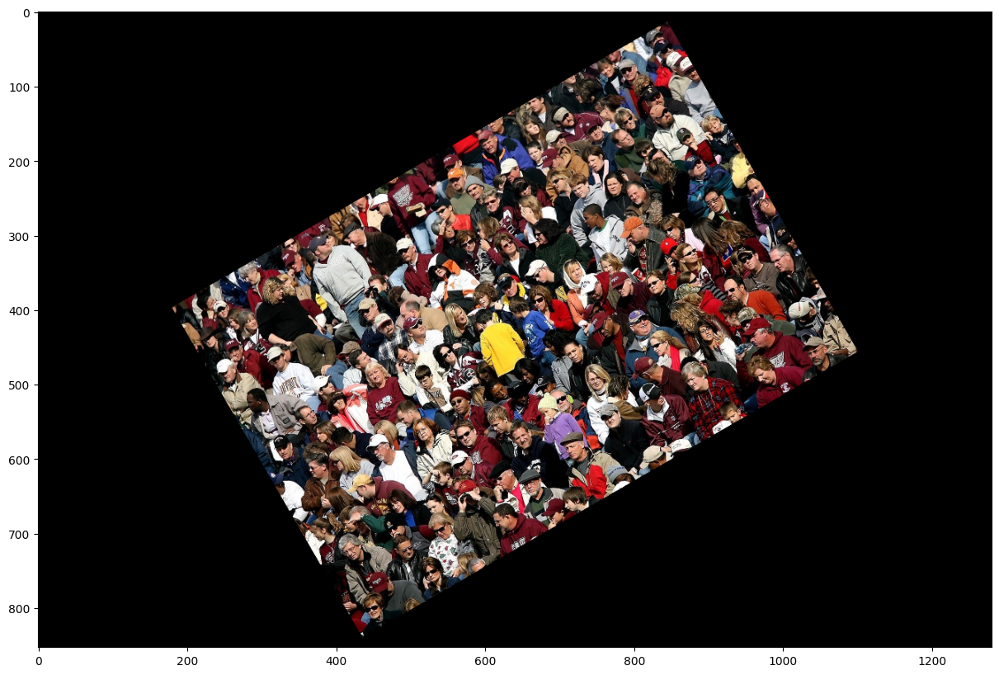

In [10]:
# f) Obróć pierwotny obraz o 30 stopni zgodnie przeciwnie do ruchu wskazówek zegara.
#    Spróbuj znaleźć rozwiązanie dla problemu wychodzenia obróconego obrazu poza okno
#    pierwotnego obrazu

rotation_matrix = cv2.getRotationMatrix2D(center=center[::-1], angle=30, scale=0.6)
rotated_image = cv2.warpAffine(src=image_rgb, M=rotation_matrix, dsize=size[::-1])
pyplot.imshow(rotated_image)

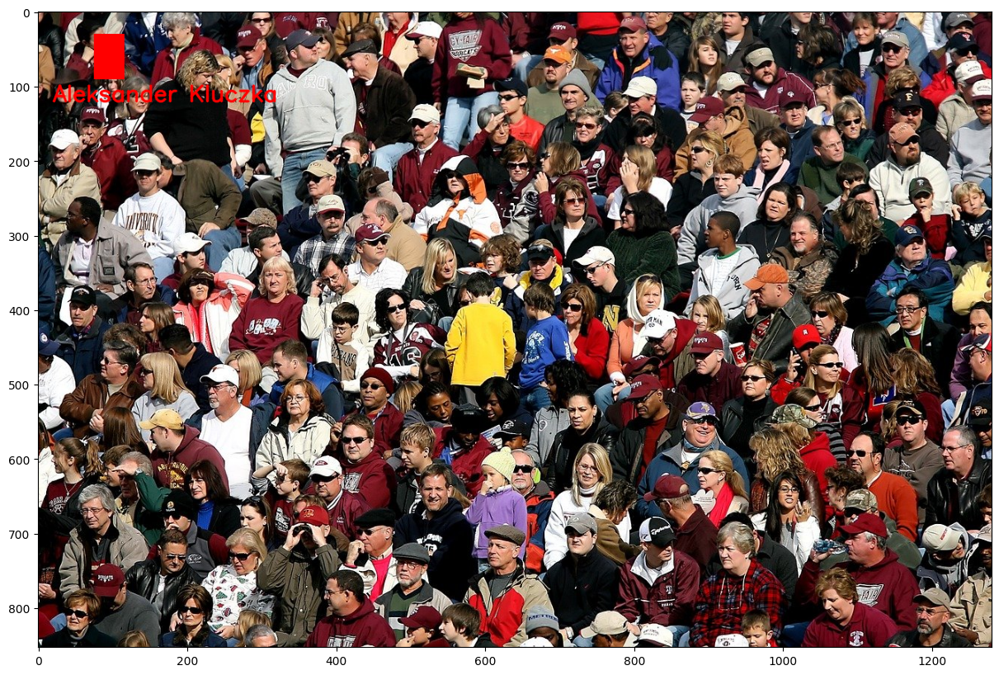

In [11]:
# g) Oznacz jedną z twarzy na pierwotnym obrazie czerwonym prostokątem i podpisz poniżej
#    imieniem i nazwiskiem.

start_point = (90, 75)
end_point = (115, 30)
image_with_rect = cv2.rectangle(
    image_rgb, pt1=(75, 30), pt2=(115, 90), color=(255, 0, 0), thickness=-1
)

image_with_rect = cv2.putText(
    img=image_rgb,
    text="Aleksander Kluczka",
    org=(20, 120),
    fontFace=cv2.FONT_HERSHEY_SIMPLEX,
    fontScale=1,
    color=(255, 0, 0),
    thickness=2,
    lineType=cv2.LINE_AA,
)
pyplot.imshow(image_with_rect)

In [14]:
# h) Zapisz obraz z punktu g)
cv2.imwrite("out/image_with_rect.jpg", image_with_rect[:, :, ::-1])

True